<a href="https://colab.research.google.com/github/david-w-masse/MTH650_Python/blob/main/MTH650_Lab3_Masse.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# ECE 550/650 QC

## Introduction to Quantum Computing

Robert Niffenegger (rniffenegger@umass.edu )


#QuTiP

Install QuTiP using 'pip' within Colab.


In [ ]:
try:
  import qutip
  print('Qutip imported')
  print(qutip.__version__)
except ImportError:
  print('Install Qutip')
  !pip install qutip

Qutip imported
5.0.4


#Qiskit

IBM's Quantum Information Software Kit

In [ ]:
try:
  import qiskit
  print('Qiskit imported')
  print(qiskit.__version__)
except ImportError:
  print('Install Qiskit')
  !pip install -q qiskit
  !pip install -q qiskit[visualization]
  #to draw 'mpl' style
  !pip install pylatexenc

try:
  from qiskit_aer import QasmSimulator
  print('Qiskit Aer imported');
except ImportError:
  print('Install Qiskit-Aer')
  !pip install --quiet qiskit-aer
  from qiskit import QuantumCircuit, transpile, assemble
  from qiskit.visualization import plot_bloch_multivector, plot_histogram
  from qiskit_aer import QasmSimulator

Qiskit imported
1.3.2
Qiskit Aer imported


### Initialize

In [ ]:
%matplotlib inline
import matplotlib.pyplot as plt
import numpy as np
from numpy import pi, sqrt, sin, cos
plt.style.use('default') #background can be set to 'dark_backgound'...
linewidth = 4

from pylab import *
import matplotlib.animation as animation
from mpl_toolkits.mplot3d import Axes3D
from IPython.display import HTML

#QuTiP
import qutip as qt
from qutip import *
from qutip.qip import *
from qutip import qeye, tensor, destroy, fock_dm
from qutip.qip.circuit import Gate
from qutip.qip.operations import *
from qutip.measurement import measure, measurement_statistics

#QISKIT
from qiskit import QuantumCircuit, transpile, assemble
from qiskit.visualization import plot_bloch_multivector, plot_histogram
from qiskit.quantum_info import Statevector
from qiskit_aer import QasmSimulator


# REVIEW FROM LECTURE:

## The Schrödinger equation

Although our assumption that rotations around the Bloch sphere could allow us to transition from one state to another was correct. This is actually due to the time evolution of the wavefunction set by the Schrödinger equation:

### $ \mathrm{i} \hbar \frac{\partial}{\partial t} | \,\psi (t) \rangle = \hat{H}(t) | \,\psi (t) \rangle $

Often this is referred to as the 'interaction' picture.

The Hamiltonian ${\hat {H}}$ here describes the energy of the system and the time dependent Schrödinger equation sets how the Hamiltonian constrains the states and their dynamics. This is similar to how the Lagrangian of a classical physics system defines the energy of systems not easily described by Newtonian ($F=ma$) analysis.  

The Hamiltonion is the total energy of the system, which is a sum of the Kinetic Energy and the potential energy.

$\hat {H}=\hat {T}+\hat {V}$ ( Kinetic energy + Potential Energy)

The Kinetic energy of a wave is given by the curvature of the wave.
(Nodes in the wave do not have kinetic energy) Therefore the second derivative in space gives the kinetic energy.

#### $\hat {T}=\frac {1}{2}m {v}^{2}=\frac {{\hat {p}}^{2}}{2m}= \frac {\hbar^2}{2m}\frac {\partial ^{2}}{{\partial x}^{2}}$

Generally the potential energy (the trap or box for our little quantum particle) could be time dependent V(t).
However it can also be static. In which case the Hamiltonian ${\hat {H}}$ is also constant in time.

If the Hamiltonian is constant in time then the Schrödinger equation can be separated into a time dependent equation and a spatially dependent equation.

### Position Dependent Schrödinger equation $|ψ(x)⟩$

#### $ E|ψ(x)⟩ =\hat{H}|ψ(x)⟩ =[\frac {\hbar^2}{2m}\frac {\partial ^{2}}{{\partial x}^{2}} + V ]|ψ(x)⟩ $

Most quantum mechanics physics courses focus on the enumerable solutions to this equation. From the harmonic oscillator to the atom. For now we will assume that we know the wavefunction solutions for our system so that we have well defined qubit states and we do not perturb the system enough to 'break' those states by changing the potential energy of the system. Further, we assume it is a close system, so that we're not losing qubits or states.

# Lab 3




# Time Dependent Schrödinger equation

Again, although our assumption that rotations around the Bloch sphere could allow us to transition from one state to another was correct. This is actually due to the time evolution of the wavefunction set by the Schrödinger equation:

## $ \mathrm{i} \hbar \frac{d}{d t} | \,\psi (t) \rangle = \hat{H} | \,\psi (t) \rangle $

Which, if $\hat{H}$ is constant in time, has the solution:

## $ |\Psi (t)\rangle =e^{-i{\hat {H}}t/\hbar }|\Psi (0)\rangle$




## Unitary
The operator $ {\hat {U}}(t)=e^{-i{\hat {H}}t/\hbar }$
is known as the time-evolution operator, and it is unitary.
If the initial state is $|\Psi (0)\rangle $
, then the state at a later time $t$ will be given by
$|\Psi (t)\rangle ={\hat {U}}(t)|\Psi (0)\rangle $

> *Unitary $\equiv$ operator preserves the total probability amplitudes of the vectors (No states are lost, no vectors leave the 'unit sphere')*.

Unitarity is a general feature of time evolution under the Schrödinger equation. If a system is non-unitary then it is an open quantum system where the state of the electron (for instance) can decay to states not connected by the rotation with the Bloch sphere. If a system is unitary then the system is closed and there is no decay of the probability below 1.

## Rotation operators about the Bloch basis

It is important to see that the description of the time evolution of a quantum state dicated by the time dependent Schrodinger equation is equivalent to a rotation of the state within the Bloch sphere.

$ |\Psi (t)\rangle =e^{-i{\hat {H}}t/\hbar }|\Psi (0)\rangle$

Generically for any axis P = {X,Y,Z} on the Bloch Sphere:

$R_{p}(\theta )=e^{(-i\theta P/2)}=\cos(\theta /2)I-i\sin(\theta /2)P$

Which is easier to see once we notice the similarity to the Euler identity:

$e^{i\theta}=\cos \theta+i\sin \theta$

The rotations of the Bloch sphere about the Cartesian axes in the Bloch basis are then given by:

\begin{aligned}R_{x}(\theta )&=e^{(-i\theta X/2)}=\cos(\theta /2)I-i\sin(\theta /2)X={\begin{bmatrix}\cos \theta /2&-i\sin \theta /2\\-i\sin \theta /2&\cos \theta /2\end{bmatrix}}\\R_{y}(\theta )&=e^{(-i\theta Y/2)}=\cos(\theta /2)I-i\sin(\theta /2)Y={\begin{bmatrix}\cos \theta /2&-\sin \theta /2\\\sin \theta /2&\cos \theta /2\end{bmatrix}}\\R_{z}(\theta )&=e^{(-i\theta Z/2)}=\cos(\theta /2)I-i\sin(\theta /2)Z={\begin{bmatrix}e^{-i\theta /2}&0\\0&e^{i\theta /2}\end{bmatrix}}\end{aligned}

In the above X,Y,Z represent the Pauli matrices:

$\sigma _{x}={\begin{pmatrix}0&1\\1&0\end{pmatrix}},\quad \sigma _{y}={\begin{pmatrix}0&-i\\i&0\end{pmatrix}},\quad \sigma _{z}={\begin{pmatrix}1&0\\0&-1\end{pmatrix}}$




## Plotting rotation about the Bloch Sphere


Quantum object: dims=[[2], [1]], shape=(2, 1), type='ket', dtype=Dense
Qobj data =
[[0.]
 [1.]]


<Figure size 500x500 with 0 Axes>

Quantum object: dims=[[2], [1]], shape=(2, 1), type='ket', dtype=Dense
Qobj data =
[[0.        -0.70710678j]
 [0.70710678+0.j        ]]


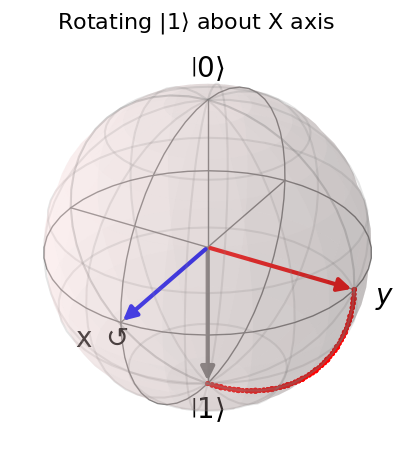

In [ ]:
fig = plt.figure(figsize=(5, 5))
ax = fig.add_subplot(projection='3d')
fig.suptitle(r'Rotating |1$\rangle$ about X axis', fontsize=16)

b = Bloch(axes=ax) #create Bloch sphere
b.vector_color = ['grey','r','b'] #set color of initial and final vectors
b.point_color = ['r']
b.point_marker = ['.']
# b.ylabel = ['y $ \circlearrowleft $', '']
b.xlabel = ['x $ \circlearrowleft $', '' ]

# Initialize the 'down' state
psi0 = spin_state( 1/2, -1/2)
print(psi0)

#Add initial vector to Bloch sphere
b.add_states(psi0)

# Twice as much rotation about the Bloch Sphere
Rotation = pi * 0.5

#Loop - to plot points along rotation arc
delta = np.linspace(0, 1, 50)
for i in range(len(delta)):

  #Apply rotation about ***X axis*** in steps
  psi1 = rx(Rotation*delta[i]) * psi0

  #Add points to Bloch sphere
  pnts = [expect(sigmax(),psi1), expect(sigmay(),psi1), expect(sigmaz(),psi1)]
  b.add_points(pnts)

#Add final vector to Bloch sphere
b.add_states(psi1)

# Add vector along X to represent rotation axis
b.add_vectors([1,0,0])

b.show()
print(psi1)


# Rotation about Z:
In lecture we constructed the Hamiltonian for an electron within a static magnetic field:

$\hat{H} = \frac{\hbar \omega}{2} \begin{pmatrix} 1 & 0 \\ 0 & -1 \end{pmatrix}$

This is just the Pauli Z matrix with the energy splitting of the two states from the Zeeman effect.

$\hat{H} = \frac{\hbar \omega}{2} \begin{pmatrix} 1 & 0 \\ 0 & -1 \end{pmatrix} = \frac{\hbar \omega}{2} \sigma_z$

Inserted into the TDSE:

#### $ |\Psi (t)\rangle =e^{-i \frac{\omega t}{2} \sigma_z }|\Psi (0)\rangle$

We see that it rotates the state about the Z axis of the Bloch sphere at a rate of the energy difference between the two states. This is just wrapping the phase of the states around as the higher energy wave function progresses faster than the lower energy state.


To see rotation about Z we need to start in a superposition state.

Quantum object: dims=[[2], [1]], shape=(2, 1), type='ket', dtype=Dense
Qobj data =
[[0.70710678]
 [0.70710678]]
Quantum object: dims=[[2], [1]], shape=(2, 1), type='ket', dtype=Dense
Qobj data =
[[4.32978028e-17-0.70710678j]
 [4.32978028e-17+0.70710678j]]


<Figure size 500x500 with 0 Axes>

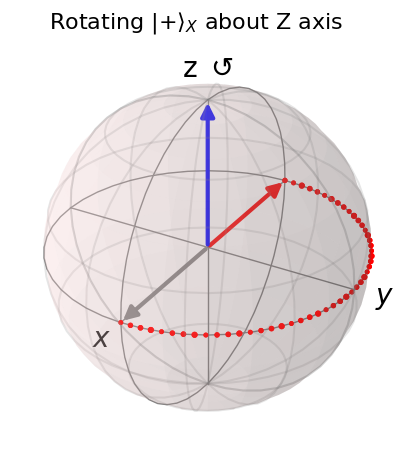

In [ ]:
fig = plt.figure(figsize=(5, 5))
ax = fig.add_subplot(projection='3d')
fig.suptitle(r'Rotating |+$\rangle_X$ about Z axis', fontsize=16)

b = Bloch(axes=ax) #create Bloch sphere
b.vector_color = ['grey','r','b'] #set color of initial and final vectors
b.point_color = ['r']
b.point_marker = ['.']
# b.ylabel = ['y $ \circlearrowleft $', '']
b.zlabel = ['z $ \circlearrowleft $', '' ]

'''
Initialize a super position state (+X state)
'''
psi0 = spin_state( 1/2, +1/2) + spin_state( 1/2, -1/2)
psi0 = psi0.unit() #Normalize the new state vector
print(psi0)

#Add initial vector to Bloch sphere
b.add_states(psi0)

# Twice as much rotation about the Bloch Sphere
Rotation = pi * 1.0

#Loop - to plot points along rotation arc
delta = np.linspace(0, 1, 50)
for i in range(len(delta)):

  #Apply rotation about ***X axis*** in steps
  psi1 = rz(Rotation*delta[i]) * psi0

  #Add points to Bloch sphere
  pnts = [expect(sigmax(),psi1), expect(sigmay(),psi1), expect(sigmaz(),psi1)]
  b.add_points(pnts)

#Add final vector to Bloch sphere
b.add_states(psi1)

# Add vector along Z to represent rotation axis
b.add_vectors([0,0,1])

print(psi1)

b.show()


We can also use quantum circuits to create this state including the final rotation.

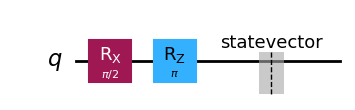

In [ ]:
'''Single qubit gate with Qiskit'''

qc = QuantumCircuit(1)# Create a Quantum Circuit acting on the q register

qc.rx( pi/2, 0)# Rotation about X of pi/2 to create super position state

qc.rz( 1*pi, 0)# Rotation about Z of pi of on qubit 1 ( Z gate/ phase gate)

qc.save_statevector() #Measure Statevector

qc.draw('mpl') #Draw circuit with color

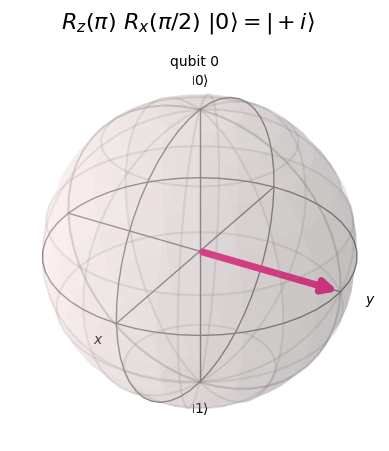

In [ ]:
from qiskit.visualization import plot_bloch_multivector

'''Simulate Quantum Circuit'''
QasmSim = QasmSimulator() #Set simulator to evolve state
job_sim = QasmSim.run(qc, shots=1) #run one shot for statevector
result_sim = job_sim.result() #save results

'''Get the statevector from result'''
statevector = result_sim.get_statevector(qc)

'''Plot result on the Bloch sphere'''
plot_bloch_multivector(statevector, title=r'$R_z(\pi)~R_x(\pi/2)~|0\rangle = |+i\rangle $ ')

#Rotation about X:

In lecture we also followed a method similar to how we construted the NOT gate to create rotations about the X axis.

Remember from lab 1:

> To construct an operator that can flip any state (|0⟩ to |1⟩ AND |1⟩ to |0⟩) we add the outer product |1⟩⟨0|.

>$|0⟩⟨1| = \begin{pmatrix} 1 \\ 0 \end{pmatrix} \begin{pmatrix}0 &  1\end{pmatrix} = \begin{pmatrix} 0 & 1 \\ 0 & 0 \end{pmatrix}$

>$|0⟩⟨1| + |1⟩⟨0|= \begin{pmatrix} 0 & 1 \\ 1 & 0 \end{pmatrix} = \hat\sigma_x$

>This X operator is logically equivalent to a NOT operation on the qubit state.
>It flips the qubit from 1 to 0 or 0 to 1. Physically it flips the spin from up to down and down to up! It is the single qubit X gate.


In lecture we saw that we can follow a similar method to construct arbtrary rotations at a set rate about X.

We will call this rate $\Omega$.

Now coupling (rotating) between the two states at a rate $\Omega$ with that same matrix $\sigma_x$.

Since the Hamiltonian is energy we have to add the factor of ħ to turn the rate into energy.

### $\hat{H} = \begin{pmatrix} 0 & \frac{\hbar \Omega}{2} \\ \frac{\hbar \Omega}{2} & 0 \end{pmatrix} = \frac{\hbar \Omega}{2} \begin{pmatrix} 0 & 1 \\ 1 & 0 \end{pmatrix} = \frac{\hbar \Omega}{2} \hat\sigma_x$

This is the Pauli X matrix with the rate of rotation $\Omega$.

Inserted into the TDSE:

##$ |\Psi (t)\rangle =e^{-i \frac{\Omega t}{2} \sigma_x }|\Psi (0)\rangle$

We see that it rotates the state about the **X axis** of the Bloch sphere at a rate Ω.

>In the next lab we will learn how to calculate the rate Ω and it's dependence on the amplitude of applied fields. For now we'll just assume we know the rate.


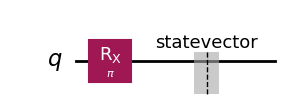

In [ ]:
'''Single qubit gate with Qiskit'''

qc = QuantumCircuit(1)# Create a Quantum Circuit acting on the q register

qc.rx( 1*pi , 0) # Add a rotation of pi about X on qubit 1 ( NOT gate )

qc.save_statevector() #Save the statevector (extract full wavefunction without measuring)

qc.draw('mpl')# Draw the circuit

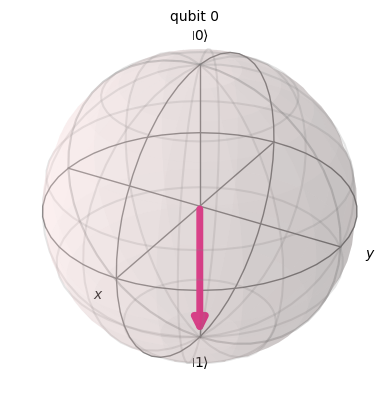

In [ ]:
'''Simulate Quantum Circuit'''
QasmSim = QasmSimulator() #Set simulator to evolve state
job_sim = QasmSim.run(qc, shots=1) #run one shot for statevector

result_sim = job_sim.result() #save results
statevector = result_sim.get_statevector(qc) #get the state vector from the simulation result

plot_bloch_multivector(statevector)

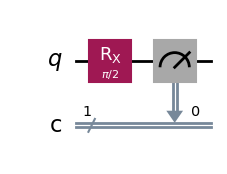

In [ ]:
'''Single qubit gate with Qiskit'''

qc = QuantumCircuit(1,1)# Quantum Circuit with 1 qubit and 1 classical bit (for measurement)

qc.rx( 1/2*pi , 0) # Add a rotation of pi about X on qubit 1 ( NOT gate )

qc.measure(0,0) # Projective Measurement in Z basis

qc.draw('mpl')# Draw the circuit



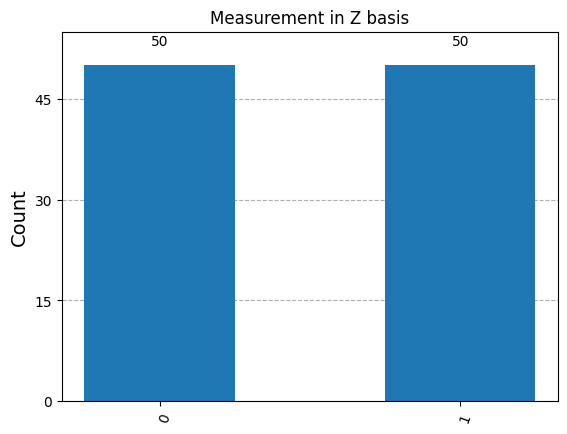

In [ ]:
job = QasmSim.run(qc, shots=100)

result = job.result()
count = result.get_counts()

plot_histogram(count, title=('Measurement in Z basis'))

#Numerical integration of the Schrödinger Equation

Now we can numerically integrate the set of ordinary differential equations of the Schrödinger Equation that define the system to solve for the time evolution.

We can use QuTiP's Schrödinger Equation evolver **'sesolve'** to perform the integration at various time steps $\delta t$ to see how the state evolves in time.

$ |\Psi (t)\rangle =e^{-i{\hat {H}} δt /\hbar }|\Psi (0)\rangle$

Using the Hamiltonian from above, rotating about X:

### $\hat{H} =\frac{\hbar \Omega}{2} \sigma_x$


##$ |\Psi (t)\rangle =e^{-i \frac{\Omega~\delta t}{2} \sigma_x }|\Psi (0)\rangle$


##$R_{x}(\theta )=e^{(-i \frac{\theta}{2} \hat \sigma_x)} = R_{x}(\Omega ~ δt )=e^{(-i \frac{\Omega~\delta t}{2} \hat \sigma_x)}$

So before we set the angle.
NOW we set the time given a fixed rate of rotation Ω.


# Animate the rotation on the Bloch sphere


'Schrödinger Equation' Solver (sesolve):

https://qutip.org/docs/latest/guide/dynamics/dynamics-master.html#unitary-evolution

https://qutip.org/docs/latest/apidoc/functions.html#module-qutip.sesolve




In [ ]:
'''
Setup input parameters
'''
psi0 = spin_state( 1/2, -1/2) # Initialize the 'down' state

Omega_Rabi = 2*pi*1 # define rotation/coupling rate in [rads/s] (2 pi rad/second = 1 revolution / second)

H = 1/2*Omega_Rabi*sigmax()  # set rotation axis as the X direction (sigma_x)

# List of times for which the solver should evolve the state
times = np.linspace(0, 2, 50) # 2 full periods around the Bloch sphere back to the original state

'''
Numerically Integrate the Schrodinger Equation
using the 'Schrödinger Equation' Solver (sesolve)

    Start with state = psi0
    Use Hamiltonian = H
    Integrate for times = times
    Store the result = results
'''
result = sesolve(H, psi0, times, [])


'''
Store the projection measurements for each basis
'''
sz =  expect(sigmaz(), result.states)
sy =  expect(sigmay(), result.states)
sx =  expect(sigmax(), result.states)


'''
Animate on the Bloch sphere
'''
import matplotlib.animation as animation

fig = plt.figure(figsize=(5, 5))
ax = fig.add_subplot(111, projection='3d') #MUST BE SUBPLOT --- WILL NOT WORK with 'Axes3d'!!!!!!
fig.suptitle(r'Rotating |1$\rangle$ about X axis', fontsize=16)

sphere = Bloch(axes=ax)
sphere.vector_color = ['b','r','grey','r']
sphere.point_color = ['y']
sphere.xlabel = ['x $ \circlearrowleft $', '']

#Animation function
def animate(i):
    sphere.clear()
    sphere.vector_color = ['b','r','grey','grey']
    sphere.add_vectors([1,0,0]) #Add vector on X axis representing rotation axis

    sphere.add_points([sx[:i+1],sy[:i+1],sz[:i+1]], meth='l') #Point for each step of the rotation
    sphere.add_vectors([sx[i],sy[i],sz[i]]) #Full vector from the simulation
    sphere.add_vectors([0,sy[i],0]) #Just the Y basis component
    sphere.add_vectors([0,0,sz[i]]) #Just the Z basis component
    sphere.make_sphere()
    return ax

def init():
    sphere.vector_color = ['r']
    return ax

ani = animation.FuncAnimation(fig, animate, np.arange(len(sx)),init_func=init, blit=False, repeat=True)

plt.close()  # Prevent display of static figure
HTML(ani.to_jshtml())


Now that we have run the simulation (integrating the differential eqns of the Schrodinger Equation).
We can plot our results.

First we'll plot the spin measured in the Z basis.

Text(0.5, 1.0, 'Spin along Z direction')

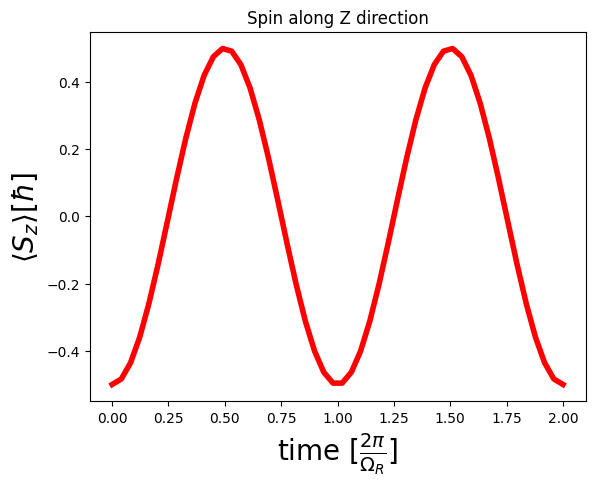

In [ ]:
#Setup Plot
fig, axes = plt.subplots(1,1)
plt.style.use('default')
fig.figsize=[8,6]
axes.set_xlabel(r'time $[\frac{2 \pi}{\Omega_R}]$', fontsize=20)
axes.set_ylabel(r'$⟨S_z⟩ [ħ]$', fontsize=20);

#Project the state onto the Z axis (find the expectation values)
expectation_values =  expect(1/2*sigmaz(), result.states)

#Plot the time dynamics of the projection along z (the expectation value)
axes.plot(times, expectation_values, '-r', lw = linewidth)
title('Spin along Z direction')


## $\sigma_z $ is the 'state' basis

This plot has projected our vector state onto the original basis we'd started with ( in the 'Z' direction of our Bloch sphere )

This projects the vector on the Bloch sphere onto a 1D line along Z. This is equivalent of asking what probability the qubit is to be in each state. As the qubit state vector is rotated (by our Hamiltonion) it oscillates between likely being 'up' and likely being 'down'.

It losses information about the relative phase of the state with respect to the pulse because the vector is now projected (like a dot product).

### The 'Z' direction of the sphere is the quantum state axis
### While the XY plane holds the phase information (complex numbers)

To actually perform the projection we ask what is the 'expectation value' in that axis.

QuTiP requires we define that which axis we're interested in so we write 'expect(sigmaz(),result.states)' to define the z direction and that we want to project the states from our result.

Typically the expectation value is a measureable quantity. Like the spin of a particle. So we'd add the appropriate prefactors to turn the expectation value of the state vector into the measureable quantity. Here spin 1/2 or specifically ±ħ/2.

Let's repeat the numerical integration but now ask what the projection along each basis is simultaneously.



In [ ]:
result = mesolve(H, psi0, times, [], [sigmaz(), sigmay(), sigmax()])
sz=result.expect[0]
sy=result.expect[1]
sx=result.expect[2]

What happens if we ask to plot the expectation value in the 'X' direction?

Text(0.5, 1.0, 'Spin along X direction')

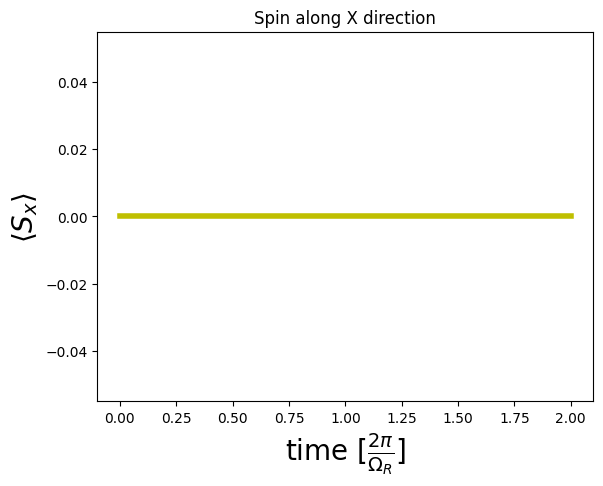

In [ ]:
fig, axes = plt.subplots(1,1)
fig.figsize=[8,6]

axes.plot(times,sx,'-y',lw=linewidth)

axes.set_xlabel(r'time $[\frac{2 \pi}{\Omega_R}]$', fontsize=20)
axes.set_ylabel(r'$\left< S_x\right>$', fontsize=20);
title('Spin along X direction')

Nothing, the state is being rotated about the X axis by the Hamiltonian so there is no projection of the vector in that direction. The expectation value should remain zero.

### Plotting all projections at the same time

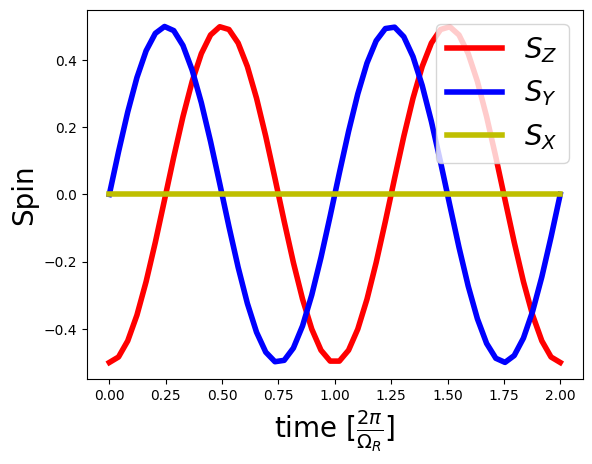

In [ ]:
fig, ax = plt.subplots(1,1)
linewidth = 4
ax.plot(times, 1/2*sz, '-r',lw=linewidth);
ax.plot(times, 1/2*sy, '-b',lw=linewidth);
ax.plot(times, 1/2*sx, '-y',lw=linewidth);

axes.set_xlabel(r'time $[\frac{2 \pi}{\Omega_R}]$', fontsize=20)
ax.set_ylabel('Spin', fontsize=20);
ax.set_xlabel(r'time $[\frac{2 \pi}{\Omega_R}]$', fontsize=20)

ax.legend(("$S_Z$", "$S_Y$", "$S_X$"), fontsize=20,loc='upper right');


We can also ask what is the expectation value of being in the initial state.

 This gives the probability of being in the initial state $|\psi_0⟩$.

 This is referred to as a Rabi oscillation which we will expand upon in the next lab.  (https://en.wikipedia.org/wiki/Rabi_cycle)

# State Measurement

Let's rotate a state by $\pi/2$ about X so that it is halfway between up and down, creating an equal superposition of the up state and the down state.



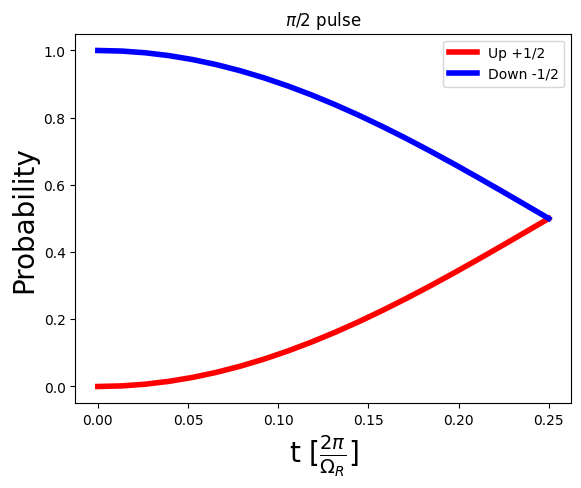

In [ ]:
'''
Setup initial state
'''
psi_up = spin_state( 1/2, +1/2)
psi_down = spin_state( 1/2, -1/2)

psi0 = psi_down

'''
Setup the Hamiltonian (rotation about X at rate \Omega_Rabi = 1 rad/s)
'''

# define rotation/coupling rate in rads/s
Omega_Rabi = 1 *2*pi # 1 rev/second = 2pi/second

# Creat the Hamiltonian and set rotation axis as the X direction (sigma_x)
H = 1/2*Omega_Rabi*sigmax()

#Time steps
times=np.linspace(0,1/4,20)

#Integrate the rotation
result = mesolve(H, psi0, times)

#Extract the expectation values of being in each state
prob_up =  expect(psi_up*psi_up.dag(), result.states)
prob_down =  expect(psi_down*psi_down.dag(), result.states)

#Plot results
fig, ax = plt.subplots(1,1)
plt.style.use('default')

ax.plot(times, prob_up,'-r',lw = linewidth)
ax.plot(times, prob_down,'-b',lw = linewidth)
plt.title('$\pi$/2 pulse')
ax.set_xlabel(r't [$\frac{2\pi}{\Omega_R}$]', fontsize=20)
ax.set_ylabel(r'Probability', fontsize=20);
ax.legend(("Up +1/2", "Down -1/2"),loc=1);

### Projection = measurement

To project the state onto one of our basis states we will use the outer product.

## |$\uparrow⟩⟨\uparrow| |ψ⟩ =$ probability that $ψ$ is in the up state

> psi_up * psi_up.dag() * psi1 = probability that $ψ$ is in the up state

https://en.wikipedia.org/wiki/Projection_(linear_algebra)

Then the function 'expect' calculates this given the input 'result.states'
>prob_up =  expect(psi_up*psi_up.dag(), result.states)

Quantum object: dims=[[2], [2]], shape=(2, 2), type='oper', dtype=Dense, isherm=True
Qobj data =
[[1. 0.]
 [0. 0.]]


(<Figure size 640x480 with 2 Axes>, <Axes: >)

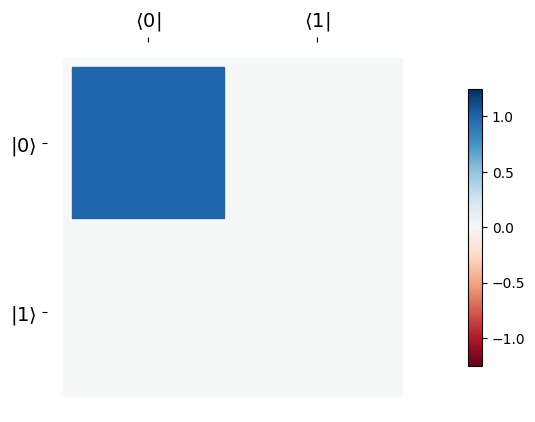

In [ ]:
#Print what the projection matrix for the up state:
print(psi_up*psi_up.dag())

#Hinton Graph of the matrix
hinton (psi_up*psi_up.dag() )

Quantum object: dims=[[2], [2]], shape=(2, 2), type='oper', dtype=Dense, isherm=True
Qobj data =
[[0. 0.]
 [0. 1.]]


(<Figure size 640x480 with 2 Axes>, <Axes: >)

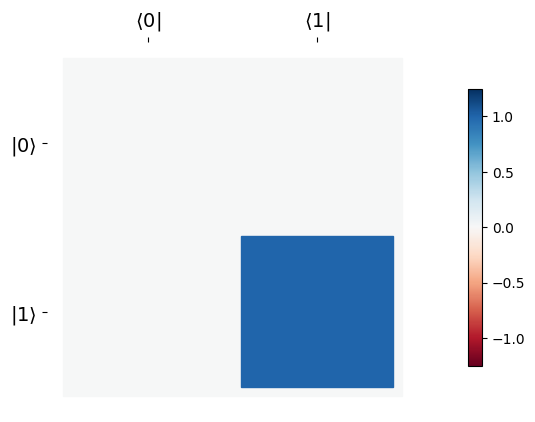

In [ ]:
print(psi_down*psi_down.dag())
hinton (psi_down*psi_down.dag() )

## Many Trials:

We can simulate how this superposition would be measured as an equal probability of being spin up and spin down. As we perform more and more trials we'd see it gets closer and closer to 50%.

Start with 100 trials then go up to 1000

In [ ]:
from qutip.measurement import measure, measurement_statistics

#Get the final state from the simulation
psi_final = result.states[-1]

results = {1.0: 0, -1.0: 0}  # 1 and -1 are the possible outcomes
for _ in range(100):
   value, new_state = measure(psi_final, sigmaz())
   results[round(value)] += 1
print(results)


{1.0: 47, -1.0: 53}


Plotting the result like in Lab 1. Shows how each 'trial' just gets one state or the other, but successive measurements start to show the equal probability.
This means we need to repeat the EXACT same experiment with the same initial state and same gates/rotations many many times to get the statistics we need for our answer.

In [ ]:
import matplotlib.animation as animation

'''
Get the final state from the numerical integration of the Schrodinger Equation
'''
psi_final = result.states[-1]

results = {1.0: 0, -1.0: 0}  # 1 and -1 are the possible outcomes
trials = 100 #Repeat measurement multiple times to aqcuire statisitics

# Create figure with two side-by-side subplots
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 6))
# Initialize empty lists to store measurement data
values = []
counts = {1.0: [], -1.0: []}

# Function to animate both plots
def animate(frame):
    if frame < trials:

        '''
        Measure Psi_F along Z
        '''
        value, new_state = measure(psi_final, sigmaz())
        values.append(value)
        results[round(value)] += 1

        # Clear both axes
        ax1.clear()
        ax2.clear()

        # Plot arrows up to current frame
        for i, val in enumerate(values):
            if val > 0:
                ax1.arrow(i, 0, 0, val, linewidth=1, head_width=1,
                         head_length=0.1, fc='r', ec='r', length_includes_head=True)
            else:
                ax1.arrow(i, 0, 0, val, linewidth=1, head_width=1,
                         head_length=0.1, fc='b', ec='b', length_includes_head=True)

        # Update arrow plot formatting
        ax1.set_title(r'Measure $|\Psi\rangle_F$ along Z')
        ax1.set_ylabel('Spin state')
        ax1.set_xlabel('Trial')
        ax1.set_ylim(-1.5, 1.5)
        ax1.set_xlim(-1, trials+1)
        ax1.set_yticks([-1, 1])  # Only show -1 and +1 ticks

        # Update bar plot
        ax2.bar(list(results.keys()), list(results.values()), color=['r', 'b'])
        ax2.set_xticks([-1, 1])  # Only show -1 and +1 ticks
        ax2.set_title('Binned Measurements')
        ax2.set_xlabel('Spin state')
        ax2.set_ylabel('Count')
        ax2.set_ylim(0, trials)

    return ax1, ax2

# Create animation
ani = animation.FuncAnimation(fig, animate, frames=trials+1,
                             interval=50, blit=False, repeat=False)
plt.close()  # Prevent display of static figure
HTML(ani.to_jshtml())

## Animation of qubit measurement

In [ ]:
import matplotlib.animation as animation


'''
Get the final state from the numerical integration of the Schrodinger Equation
'''
psi_final = result.states[-1]

trials = 100
results = {1.0: 0, -1.0: 0}

# Create figure with two subplots
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 5))
plt.style.use('default')

# Setup scatter plot
line_up, = ax1.plot([], [], '.r')
line_down, = ax1.plot([], [], '.b')

x_up, y_up = [], []
x_down, y_down = [], []

# Setup histogram
bar_container = ax2.bar([1.0, -1.0], [0, 0], color=['red', 'blue'])
ax2.set_ylim(0, trials)
ax2.set_xlim(-1.5, 1.5)

def init():
    ax1.set_xlim(0, trials)
    ax1.set_ylim(-1.2, 1.2)
    for bar in bar_container:
        bar.set_height(0)
    return line_up, line_down, *bar_container

def animate(i):
    value, new_state = measure(psi_final, sigmaz())
    results[round(value)] += 1

    if value > 0:
        x_up.append(i)
        y_up.append(value)
    else:
        x_down.append(i)
        y_down.append(value)

    line_up.set_data(x_up, y_up)
    line_down.set_data(x_down, y_down)

    # Update histogram
    bar_container[0].set_height(results[1.0])
    bar_container[1].set_height(results[-1.0])

    return line_up, line_down, *bar_container

ax1.set_title(r'Measure $\Psi_F$ along Z')
ax1.set_ylabel('State')
ax1.set_xlabel('Trial')

ax2.set_title('Measurement Statistics')
ax2.set_ylabel('Counts')
ax2.set_xlabel('State')

plt.tight_layout()

anim = animation.FuncAnimation(fig, animate, init_func=init,
                             frames=trials, interval=50, blit=True)
plt.close()  # Prevent display of static plot
from IPython.display import HTML
HTML(anim.to_jshtml())


##Measurement Uncertainty

Let's plot the same rotation but now use QuTiP to simulate the randomness of the measurement. Allowing the same slightly misbalanced 50/50 split we see for the final time step to be shown for ALL of the time steps.


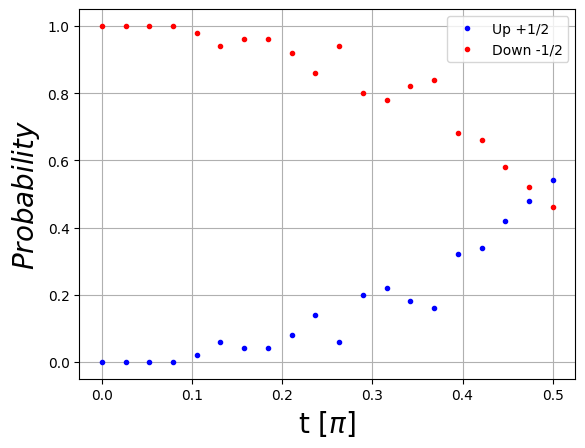

In [ ]:
'''
Run simluation of rotation of vector state psi0 by Hamiltonian H for list in times
'''
H = sigmax()/2
times=np.linspace(0,pi/2,20) #just a pi/2 rotation
result = mesolve(H, psi0, times, [], [])

results = {1.0: 0, -1.0: 0}  # 1 and -1 are the possible outcomes
trials = 50
measured_up = []
measured_dn = []
for i in range(len(times)):
  for _ in range(trials):
    value, new_state = measure(result.states[i], sigmaz())
    results[round(value)] += 1
  # print(results[1.0]/100)
  # print(result.states[i])
  # print(i)
  measured_up.append(results[1.0]/trials)
  measured_dn.append(results[-1.0]/trials)
  results = {1.0: 0, -1.0: 0}

'''
Plot
'''
fig, axes = plt.subplots(1,1)
plt.style.use('default')
axes.plot(times/pi, measured_up,'.b')
axes.plot(times/pi, measured_dn,'.r')

axes.set_xlabel(r't $[\pi ]$', fontsize=20)
axes.set_ylabel(r'$Probability$', fontsize=20);
axes.legend(("Up +1/2", "Down -1/2"));
plt.grid()

# What does *'real'* quantum data look like?

This is actually *very similar* to what real data from a qubit would look like in practice.

It is important to emphasize that we're plotting the probability of measuring each spin state. Actually we're only ever measuring up or down, because the states are quantized. Indeed this is a very fundamental aspect of quantum states, they have no intermediates, but they can have equal probabilities.

 Another way to plot the data is to show each measurement as a datapoint that is either up or down. Only when we average them together do we see the 50/50 split. This is very similar to flipping a coin that can never stand on edge. It must always fall heads or tails, but when we flip it we find we can have an equal chance of it being heads and it being tails.

Lets extend the time of the rotation so that it flips around a few times before stopping at an equal superposition of up and down.

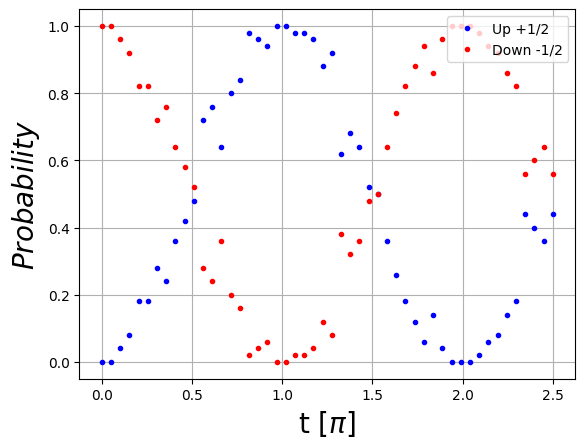

In [ ]:
# Run simluation of rotation of vector state psi0 by Hamiltonian H for list in times
Omega_Rabi = 1 # rad/s
H = Omega_Rabi*sigmax()/2

times=np.linspace(0,2.5*pi,50) #2 and one half rotation
result = mesolve(H, psi0, times, [], [])

results = {1.0: 0, -1.0: 0}  # 1 and -1 are the possible outcomes
trials = 50
measured_up = []
measured_dn = []
for i in range(len(times)):
  for _ in range(trials):
    value, new_state = measure(result.states[i], sigmaz())
    results[round(value)] += 1
  # print(results[1.0]/100)
  # print(result.states[i])
  # print(i)
  measured_up.append(results[1.0]/trials)
  measured_dn.append(results[-1.0]/trials)
  results = {1.0: 0, -1.0: 0}

#Plot
fig, axes = plt.subplots(1,1)
plt.style.use('default')
axes.plot(times/pi, measured_up,'.b')
axes.plot(times/pi, measured_dn,'.r')

axes.set_xlabel(r't $[\pi ]$', fontsize=20)
axes.set_ylabel(r'$Probability$', fontsize=20);
axes.legend(("Up +1/2", "Down -1/2"),loc='upper right');
plt.grid()

REMEMBER:
##We're only getting  up or down for each trial of each time step.

100 trials for time step 1.

100 trials for time step 2.

etc.

etc.

We can plot just the raw up or down measurements for all time steps like this:

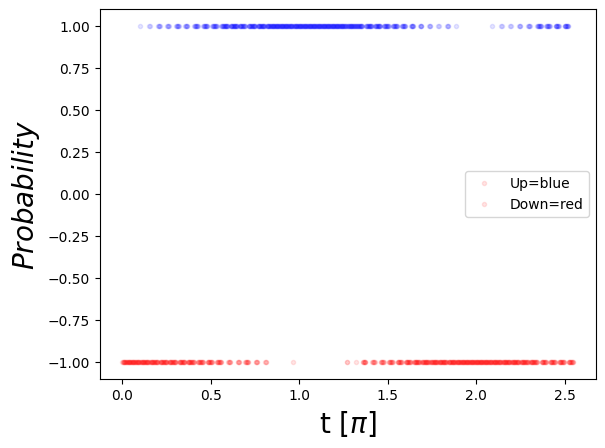

In [ ]:
fig, axes = plt.subplots(1,1)
plt.style.use('default')
trials = 20
alphaset = 2 / trials
for i in range(len(times)):
  for itrial in range(trials):
    if measured_up[i]*trials>itrial:
      axes.plot((times[i]+itrial/trials*times[1])/pi, 1,'.b', alpha=alphaset)
      # plt.arrow((times[i]),0.5,0,+measured_up[i]/2, linewidth=3,head_width=0.1, head_length=0.05, fc='b', ec='b', length_includes_head = 1, alpha=alphaset)
    else:
      axes.plot((times[i]+itrial/trials*times[1])/pi, -1,'.r', alpha=alphaset)
      # plt.arrow((times[i]),0.5,0,-measured_dn[i]/2, linewidth=3,head_width=0.1, head_length=0.05, fc='r', ec='r', length_includes_head = 1, alpha=alphaset)

  # axes.plot(times*1e6, measured_dn,'.r')

axes.set_xlabel(r't [$\pi$]', fontsize=20)
axes.set_ylabel(r'$Probability$', fontsize=20);
axes.legend(("Up=blue", "Down=red"));


If we want to see the probability of getting each state we can superimpose a vector with a magnitidue = the probability of measuring each direction.


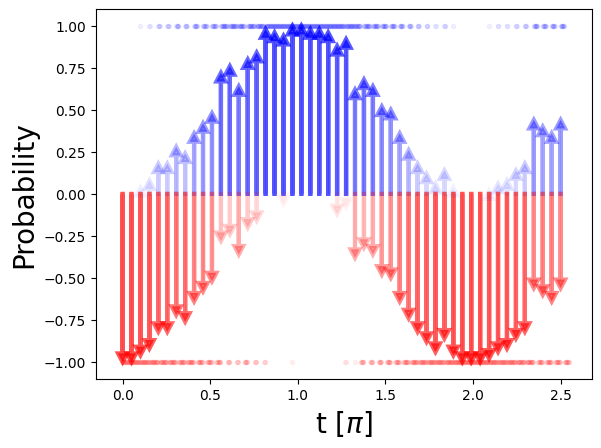

In [ ]:
fig, axes = plt.subplots(1,1)
plt.style.use('default')
trials = 20
alphaset = 1/ trials
for i in range(len(times)):
  for itrial in range(trials):
    if measured_up[i]*trials>itrial:
      axes.plot((times[i]+itrial/trials*times[1])/pi, 1,'.b', alpha=alphaset)
      plt.arrow((times[i])/pi,0,0,+measured_up[i], linewidth=3,head_width=0.05, head_length=0.05, fc='b', ec='b', length_includes_head = 1, alpha=alphaset)

    else:
      axes.plot((times[i]+itrial/trials*times[1])/pi, -1,'.r', alpha=alphaset)
      plt.arrow((times[i])/pi,0,0,-measured_dn[i], linewidth=3,head_width=0.05, head_length=0.05, fc='r', ec='r', length_includes_head = 1, alpha=alphaset)

  # axes.plot(times*1e6, measured_dn,'.r')

axes.set_xlabel(r't [$\pi$]', fontsize=20)
axes.set_ylabel(r'Probability', fontsize=20);
# axes.legend(("Up=blue", "Down=red"),loc=2);


In [ ]:
from matplotlib.animation import FuncAnimation

fig, ax = plt.subplots(figsize=(8, 6))
plt.style.use('default')

# Initialize empty plots that will be updated
scatter_up = ax.scatter([], [], c='blue', alpha=0.5, label='Up')
scatter_down = ax.scatter([], [], c='red', alpha=0.5, label='Down')
line_avg, = ax.plot([], [], 'o-k', lw=2, label='Average')  # New line plot for average values
arrows_up = []
arrows_down = []

ax.set_xlim(min(times)/pi - 0.1, max(times)/pi + 0.1)
ax.set_ylim(-1.2, 1.2)
ax.set_xlabel(r't [$\pi$]', fontsize=20)
ax.set_ylabel(r'Probability', fontsize=20)
ax.legend()

def init():
    scatter_up.set_offsets(np.c_[[], []])
    scatter_down.set_offsets(np.c_[[], []])
    line_avg.set_data([], [])
    return scatter_up, scatter_down, line_avg

def animate(frame):
    # Clear previous arrows
    for arrow in arrows_up + arrows_down:
        arrow.remove()
    arrows_up.clear()
    arrows_down.clear()

    # Update up to current frame
    up_x, up_y = [], []
    down_x, down_y = [], []

    for i in range(frame + 1):
        for itrial in range(trials):
            t = times[i] + itrial/trials * times[1]
            if measured_up[i]*trials > itrial:
                up_x.append(t/pi)
                up_y.append(1)
                if i == frame:  # Only add arrow for current frame
                    arr = ax.arrow(times[i]/pi, 0, 0, measured_up[i],
                                   linewidth=3, head_width=0.05, head_length=0.05,
                                   fc='b', ec='b', length_includes_head=True, alpha=0.5)
                    arrows_up.append(arr)
            else:
                down_x.append(t/pi)
                down_y.append(-1)
                if i == frame:  # Only add arrow for current frame
                    arr = ax.arrow(times[i]/pi, 0, 0, -measured_dn[i],
                                   linewidth=3, head_width=0.05, head_length=0.05,
                                   fc='r', ec='r', length_includes_head=True, alpha=0.5)
                    arrows_down.append(arr)

    scatter_up.set_offsets(np.c_[up_x, up_y])
    scatter_down.set_offsets(np.c_[down_x, down_y])

    # Add a line plot of the average values at each time
    # Here we compute the average outcome at each time as (2*measured_up - 1),
    # which is equivalent to (measured_up - measured_dn) if measured_dn = 1 - measured_up.
    avg_x = [times[i]/pi for i in range(frame+1)]
    avg_y = [2*measured_up[i] - 1 for i in range(frame+1)]
    line_avg.set_data(avg_x, avg_y)

    return scatter_up, scatter_down, line_avg

anim = FuncAnimation(fig, animate, init_func=init, frames=len(times),
                     interval=100, blit=True)

plt.close()  # Prevent display of static plot
from IPython.display import HTML
HTML(anim.to_jshtml())


### Exercise:
Time Dependent Schrödinger equation:

$ \mathrm{i} \hbar \frac{d}{d t} | \,\psi (t) \rangle = \hat{H} | \,\psi (t) \rangle $

Which, if $\hat{H}$ is constant in time, has the solution:

$ |\Psi (t)\rangle =e^{-i{\hat {H}}t/\hbar }|\Psi (0)\rangle$

Verify this by hand.

# Homework 3

1. Create a new copy of this notebook just for the problem set
1. Work with a partner or group of three to solve the problems
1. Summarize your results in a short report and upload to gradescope
1. Include a link to your colab notebook code
1. Make sure the link gives 'General access' for 'Anyone with the link' to comment (and view)


### Problem 1:

Write code using the QuTiP library to perform the following two experiments:

1. Initialize a state $|\Psi\rangle = |+\rangle$
2. Measure $|\Psi\rangle$ in the X basis
3. Then measure the resulting state in the Z basis
4. Plot the results

'

1. Initialize a state in $|\Psi\rangle = |+\rangle$
2. Measure $|\Psi\rangle$ in the Z basis
3. Then measure the resulting state in the X basis
4. Plot the results

> Perform each set of measurements 100 trials to verify statisitics.

Compare your results.



### Problem 2:

Simulate the last step of a Mach Zehnder interferometer (MZI) by integrating the Shrodinger Equation using the QuTiP libarary.

1. Start from $|+\rangle$
1. Rotate to $|0\rangle$
1. Measure in the Z basis
1. Verify with 100 trials of measurements
1. Plot your results


### Problem 3:

Modify the QISKIT code below to create a single qubit circuit for the full MZI sequence with a phase shift.

Verify you get the correct answer with both input states.
1. Input $|\Psi\rangle = |0\rangle$
1. Input $|\Psi\rangle = |1\rangle$

Bonus: What angle for the Z rotation will leave the final state in a superposition?


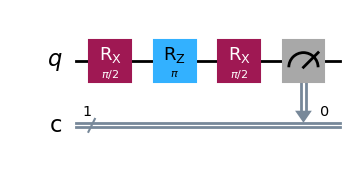

In [ ]:
'''Single qubit gate with Qiskit'''

qc = QuantumCircuit(1,1)# Create a Quantum Circuit acting on the q register

# Rotation about X of pi/2 to
qc.rx( bit_rotation_angle, qubit_index)

# Rotation about Z of pi ( Z gate/ phase gate)
qc.rz( phase_rotation_angle, qubit_index)

#Additional gate...


qc.measure(qubit_index,bit_index) #Measure Statevector

qc.draw('mpl') #Draw circuit with color

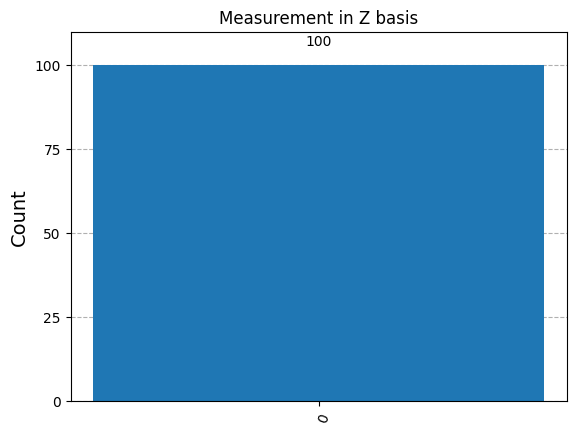

In [ ]:
job = QasmSim.run(qc, shots=100)

result = job.result()
count = result.get_counts()

plot_histogram(count, title=('Measurement in Z basis'))

### Problem 4:

1. Initialize a superposition state $|\Psi\rangle = |+i\rangle$
1. Integrate the Schrodinger Equation to rotate the state about the X axis
1. Plot the probability of measuring each spin in the Z basis during a full $2\pi$ rotation
1. Perform 100 measurements for each data point.

# End of Lab 3


References:

https://qutip.org/docs/latest/guide/guide-states.html#qubit-two-level-systems

https://qutip.org/docs/latest/guide/dynamics/dynamics-master.html

Pulse-level noisy quantum circuits with QuTiP
https://arxiv.org/abs/2105.09902v2